In [1]:
import laspy
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors
from colorspacious import cspace_converter
import matplotlib as mpl
import scipy 

file_name = "220829GO15D"
#change file name according to flight being analysed

base_dir = "C:/Hobbies/programming/data/"
#file_path = base_dir + file_name + '/' + file_name + "_C_A.las"
#use file_path below for multiple flights on one date and adjust carefully
file_path = "C:/Hobbies/programming/data/220829GO15D/22GOempty/" + file_name + "_EMPTY_C_A.las"



In [40]:
def read_las(filename):
    reader = laspy.open(filename)
    pts = reader.read_points(reader.header.point_count)
    points = pd.DataFrame({
        'x': np.array(pts.x), 
        'y': np.array(pts.y), 
        'z': np.array(pts.z)
    })
    return points


data_table = read_las(file_path)
data_table.to_csv(file_name + "_C_A.csv")


In [41]:
import tqdm
#use the line below if loading a previously saved .csv to avoid index troubles
data_table = pd.read_csv(file_name + "_C_A.csv", index_col = 0)

#SCALE is the value by which all the x and y values will be divided for the decimation
SCALE = 0.05

#divides the x and y values of each point by SCALE and keeps the value rounded down to a full intiger.
#This gives neighbouring points the same grid_x and grid_y values.
def grid_ID(): 
    grid_xs = []
    grid_ys = []
    for x,y,_ in tqdm.tqdm(data_table.values):
        grid_x = x//SCALE
        grid_y = y//SCALE
        grid_xs.append(grid_x)
        grid_ys.append(grid_y)
        #grid_ID = grid_x, grid_y
        #gris_IDs.append(grid_ID)
    data_table['grid_x']= grid_xs
    data_table['grid_y']= grid_ys
    
grid_ID()


#Creates a new .csv to continue transformations on and reassigns the variable data_table
#data_table.to_csv(file_name + "_C_grid_ID.csv")
#data_table = pd.read_csv(file_name + "_C_grid_ID.csv", index_col = 0)

#makes tables for each row with matching grid_x and grid_y and from each table picks out the lowest z. 
#Creates a new table with all those lowest z values.
min_z = data_table.groupby(['grid_x', 'grid_y'])['z'].min().reset_index()

min_z
        
    




100%|██████████████████████████████████████████████████████████████████| 10491830/10491830 [00:14<00:00, 720939.07it/s]


,grid_x,grid_y,z
0,6199781.0,103242918.0,533.251
1,6199787.0,103242942.0,533.274
2,6199793.0,103242925.0,533.244
3,6199796.0,103242906.0,533.206
4,6199799.0,103242949.0,533.274
...,...,...,...
3981398,6203744.0,103245944.0,519.479
3981399,6203749.0,103245927.0,525.873
3981400,6203752.0,103245936.0,531.791
3981401,6203752.0,103245953.0,519.615


In [42]:
min_z[["x","y"]] = min_z[['grid_x', 'grid_y']] * SCALE

min_z.to_csv(file_name + "_C_A_decimated_"+ str(SCALE) +".csv")    

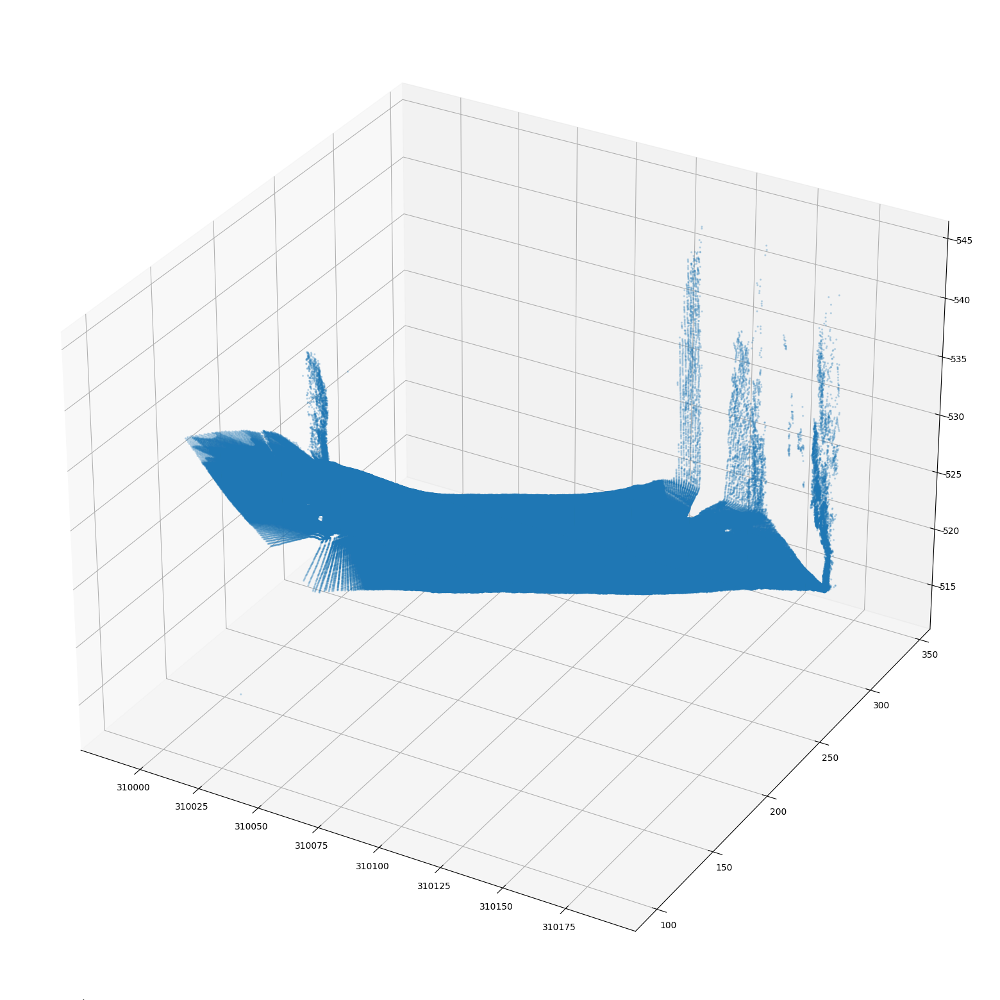

In [43]:


fig = plt.figure(figsize = (20, 20))
ax = fig.add_subplot(projection='3d')
#ax.scatter(data_table.x, data_table.y, data_table.z, s = 1, alpha = 0.2)
ax.scatter(min_z.x, min_z.y, min_z.z, s = 2, alpha = 0.2)




In [6]:
datasets = dict(
    file_220829 = pd.read_csv("220829GO15D_EMPTY_C_A_decimated_0.05.csv"),
    file_220905 = pd.read_csv("220905GO15D_C_A_decimated_0.05.csv"),
    file_220912 = pd.read_csv("220912GO15D_C_A_decimated_0.05.csv"),
    file_221020 = pd.read_csv("221020GO60D_C_A_decimated_0.05.csv"),
    file_221101 = pd.read_csv("221101GO15D_C_A_decimated_0.05.csv"),
    file_221117 = pd.read_csv("221117GO15D_C_A_decimated_0.05.csv"),
    file_221128 = pd.read_csv("221128GO15D_C_A_decimated_0.05.csv"),
    file_230119 = pd.read_csv("230119GO15D_C_A_decimated_0.05.csv"))
      


In [10]:
def file_difference(data1, data2):
    zdif = data1.set_index(['grid_x', 'grid_y']).z - data2.set_index(['grid_x', 'grid_y']).z
    return zdif

def difference_file_name(tag1, tag2):
    return "height_differences_" + tag1 + "_" + tag2 + ".csv"

def save_height_difference(tag1, tag2):
    file_difference(datasets[tag1], datasets[tag2]).to_csv(difference_file_name(tag1, tag2))

In [ ]:
#compare all entries in datasets to entry tag1
tag1 = "file_220905"
for tag2, data2 in datasets.items():
    if tag2 == tag1:
        continue
    else:
        save_height_difference(tag1, tag2)

In [102]:
#insert tags of datasets to be compared as arguments

save_height_difference("file_221101", "file_221128")

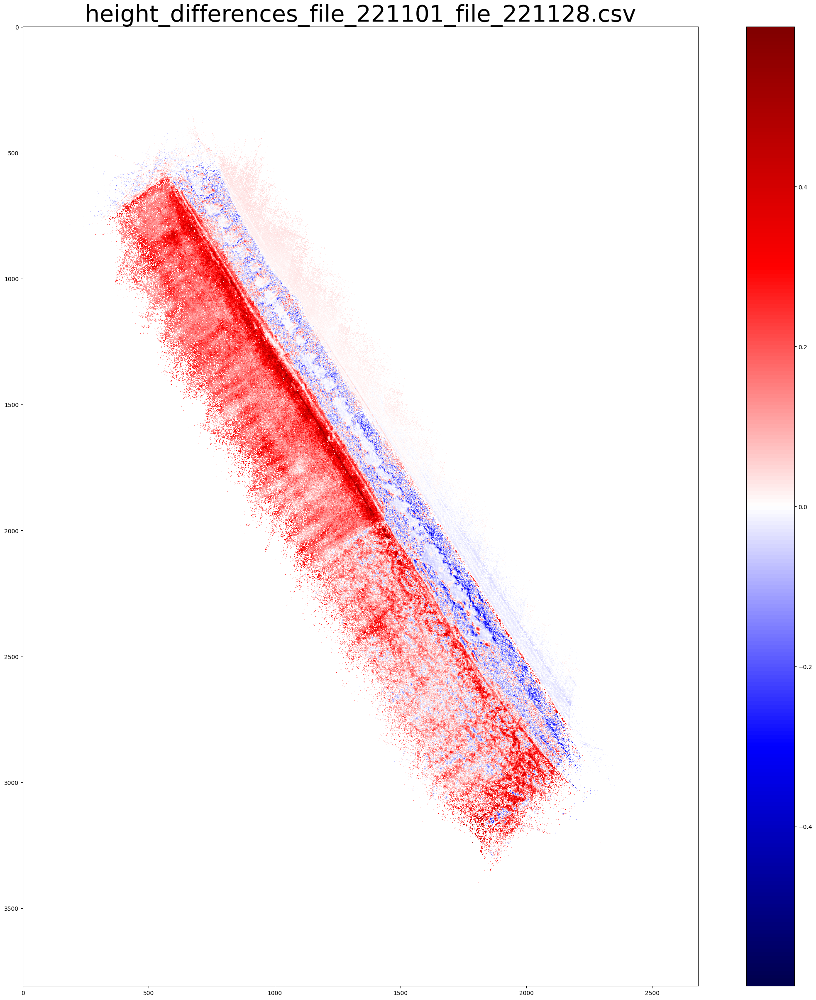

In [104]:
#z differences in about ? days between 221101 (66 days after burial) and 221128 (93 days after burial) (decimated to 5cm squares)

file1 = "file_221101"
file2 = "file_221128"

zdiff = pd.read_csv(difference_file_name(file1, file2))

grid = zdiff.reset_index().pivot_table(columns='grid_x', index='grid_y', values='z')
plt.figure(figsize=(30, 30))
#grid.values[np.abs(grid.values) > 0.8] = np.nan
divnorm=colors.TwoSlopeNorm(vmin=-0.6, vcenter=0, vmax=0.6)
plt.title(difference_file_name(file1, file2), fontsize=40)
plt.imshow(grid.values, cmap = mpl.colormaps['seismic'], norm=divnorm)

plt.colorbar()

plt.savefig(difference_file_name(file1, file2).replace(".csv", ".png"))

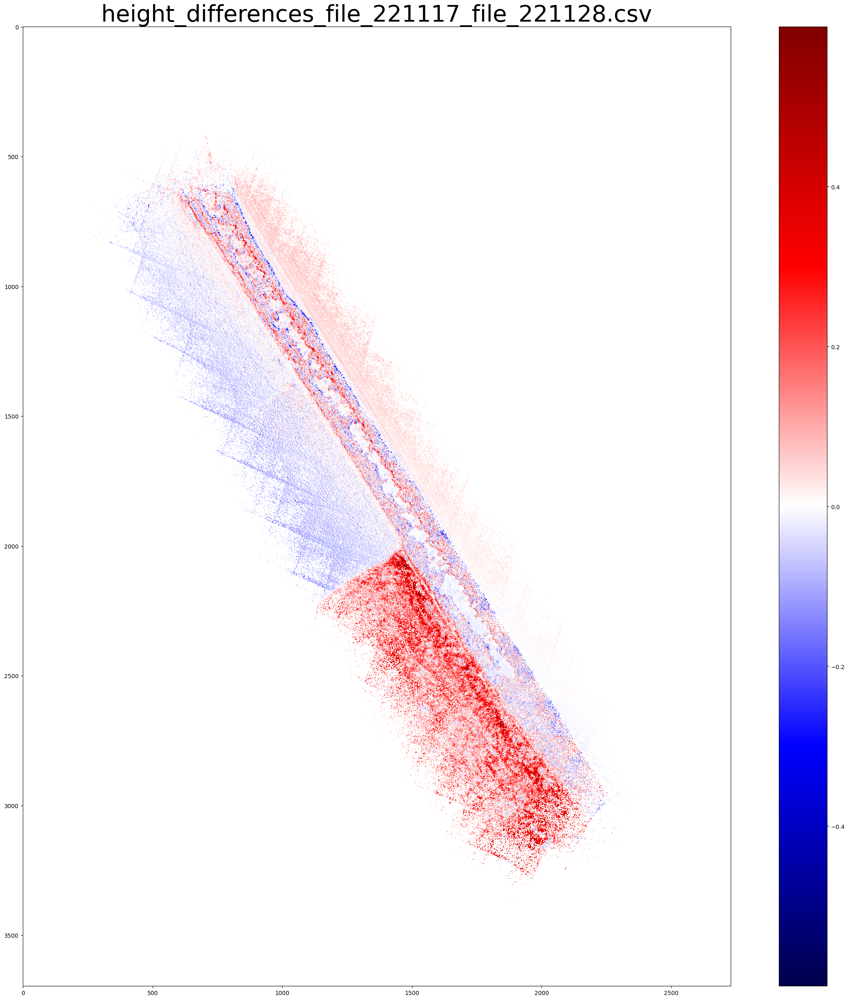

In [101]:
#z differences in about 11 days between 221117 (82 days after burial) and 221128 (93 days after burial) (decimated to 5cm squares)

file1 = "file_221117"
file2 = "file_221128"

zdiff = pd.read_csv(difference_file_name(file1, file2))

grid = zdiff.reset_index().pivot_table(columns='grid_x', index='grid_y', values='z')
plt.figure(figsize=(30, 30))
#grid.values[np.abs(grid.values) > 0.8] = np.nan
divnorm=colors.TwoSlopeNorm(vmin=-0.6, vcenter=0, vmax=0.6)
plt.title(difference_file_name(file1, file2), fontsize=40)
plt.imshow(grid.values, cmap = mpl.colormaps['seismic'], norm=divnorm)

plt.colorbar()

plt.savefig(difference_file_name(file1, file2).replace(".csv", ".png"))

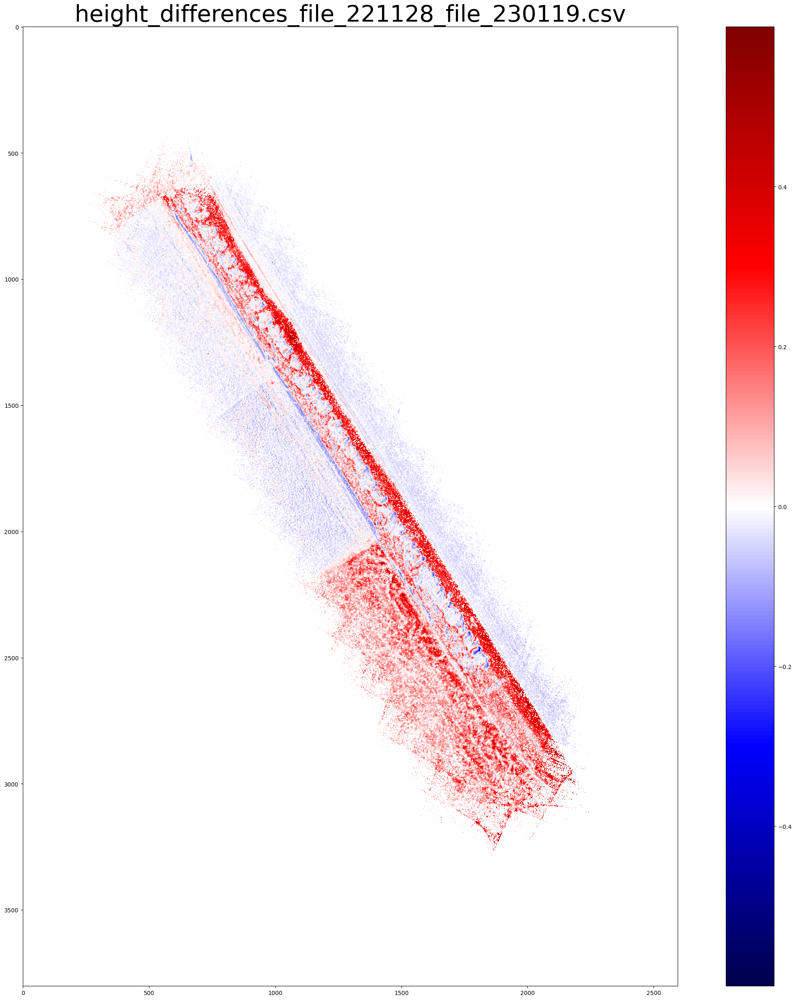

In [99]:
#z differences in about 53 days between 221128 (93 days after burial) and 230119 (decimated to 5cm squares)

file1 = "file_221128"
file2 = "file_230119"

zdiff = pd.read_csv(difference_file_name(file1, file2))

grid = zdiff.reset_index().pivot_table(columns='grid_x', index='grid_y', values='z')
plt.figure(figsize=(30, 30))
#grid.values[np.abs(grid.values) > 0.8] = np.nan
divnorm=colors.TwoSlopeNorm(vmin=-0.6, vcenter=0, vmax=0.6)
plt.title(difference_file_name(file1, file2), fontsize=40)
plt.imshow(grid.values, cmap = mpl.colormaps['seismic'], norm=divnorm)

plt.colorbar()

plt.savefig(difference_file_name(file1, file2).replace(".csv", ".png"))

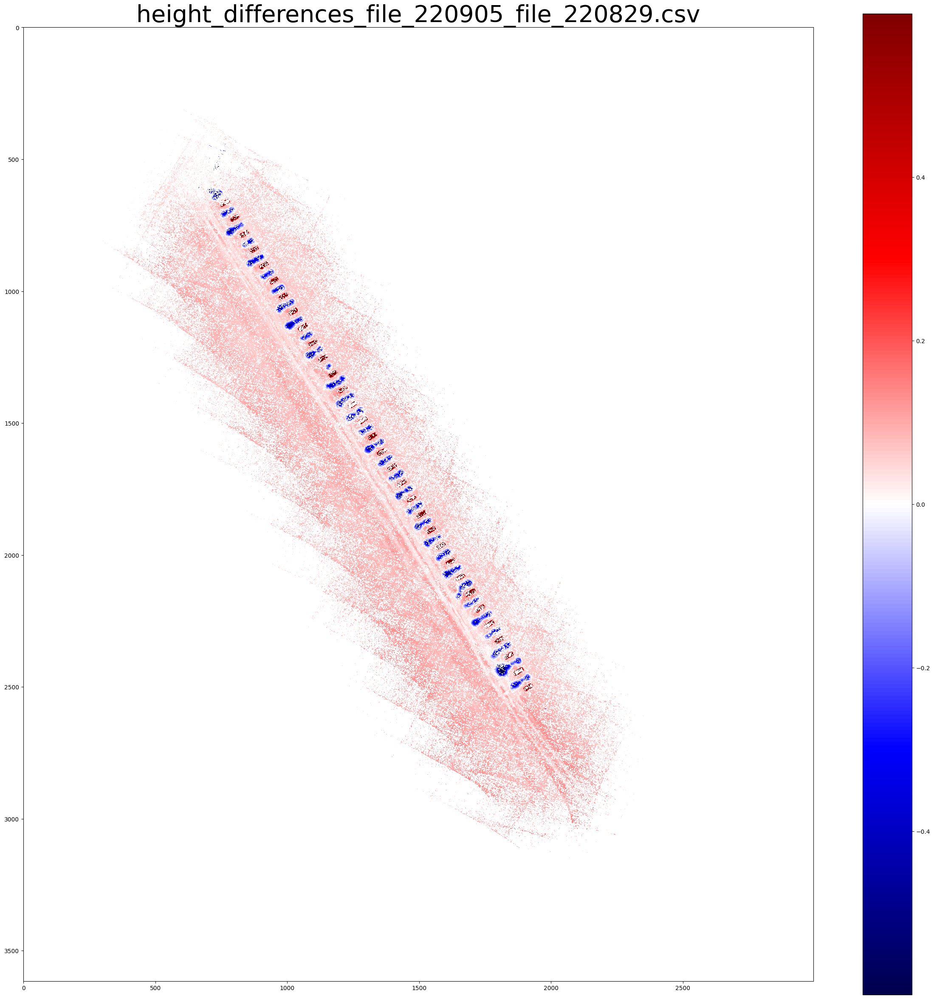

In [96]:
#z differences in about 1 week between 220905 and 220829 (open graves) (decimated to 5cm squares)

file1 = "file_220905"
file2 = "file_220829"

zdiff = pd.read_csv(difference_file_name(file1, file2))

grid = zdiff.reset_index().pivot_table(columns='grid_x', index='grid_y', values='z')
plt.figure(figsize=(30, 30))
#grid.values[np.abs(grid.values) > 0.8] = np.nan
divnorm=colors.TwoSlopeNorm(vmin=-0.6, vcenter=0, vmax=0.6)
plt.title(difference_file_name(file1, file2), fontsize=40)
plt.imshow(grid.values, cmap = mpl.colormaps['seismic'], norm=divnorm)

plt.colorbar()

plt.savefig(difference_file_name(file1, file2).replace(".csv", ".png"))

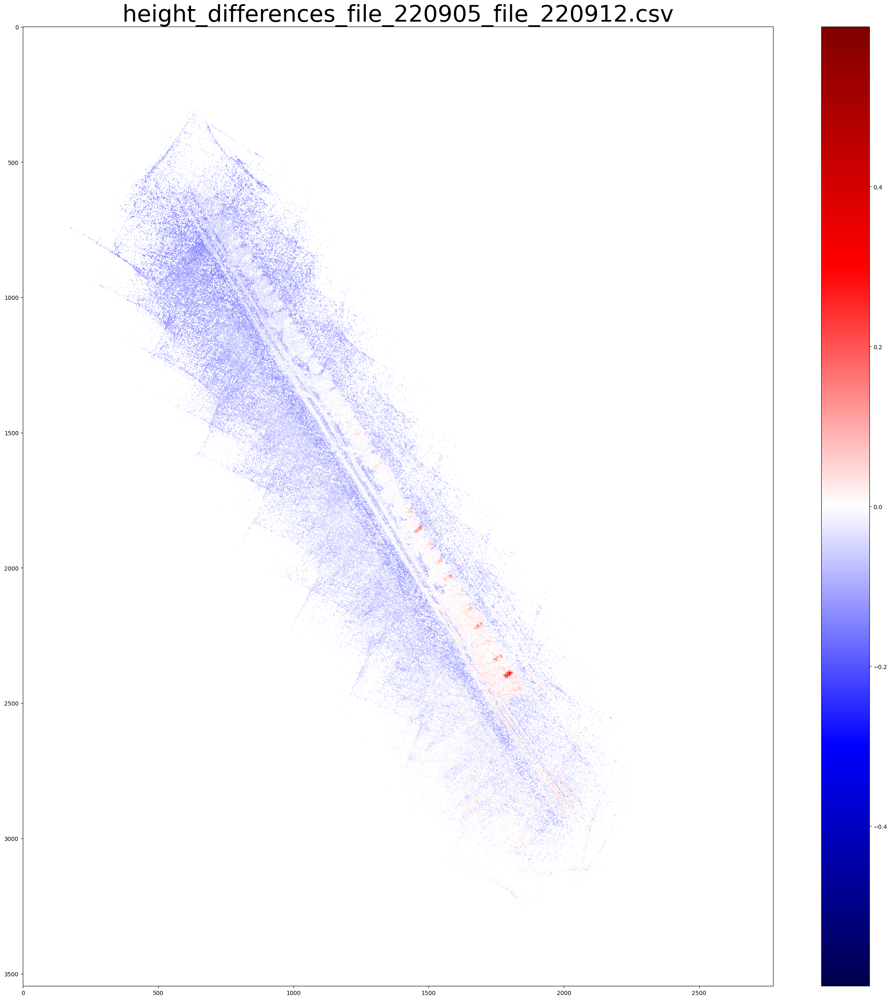

In [95]:
#z differences in about 1 week between 220905 and 220912 (decimated to 5cm squares)

file1 = "file_220905"
file2 = "file_220912"

zdiff = pd.read_csv(difference_file_name(file1, file2))

grid = zdiff.reset_index().pivot_table(columns='grid_x', index='grid_y', values='z')
plt.figure(figsize=(30, 30))
#grid.values[np.abs(grid.values) > 0.8] = np.nan
divnorm=colors.TwoSlopeNorm(vmin=-0.6, vcenter=0, vmax=0.6)
plt.title(difference_file_name(file1, file2), fontsize=40)
plt.imshow(grid.values, cmap = mpl.colormaps['seismic'], norm=divnorm)

plt.colorbar()

plt.savefig(difference_file_name(file1, file2).replace(".csv", ".png"))

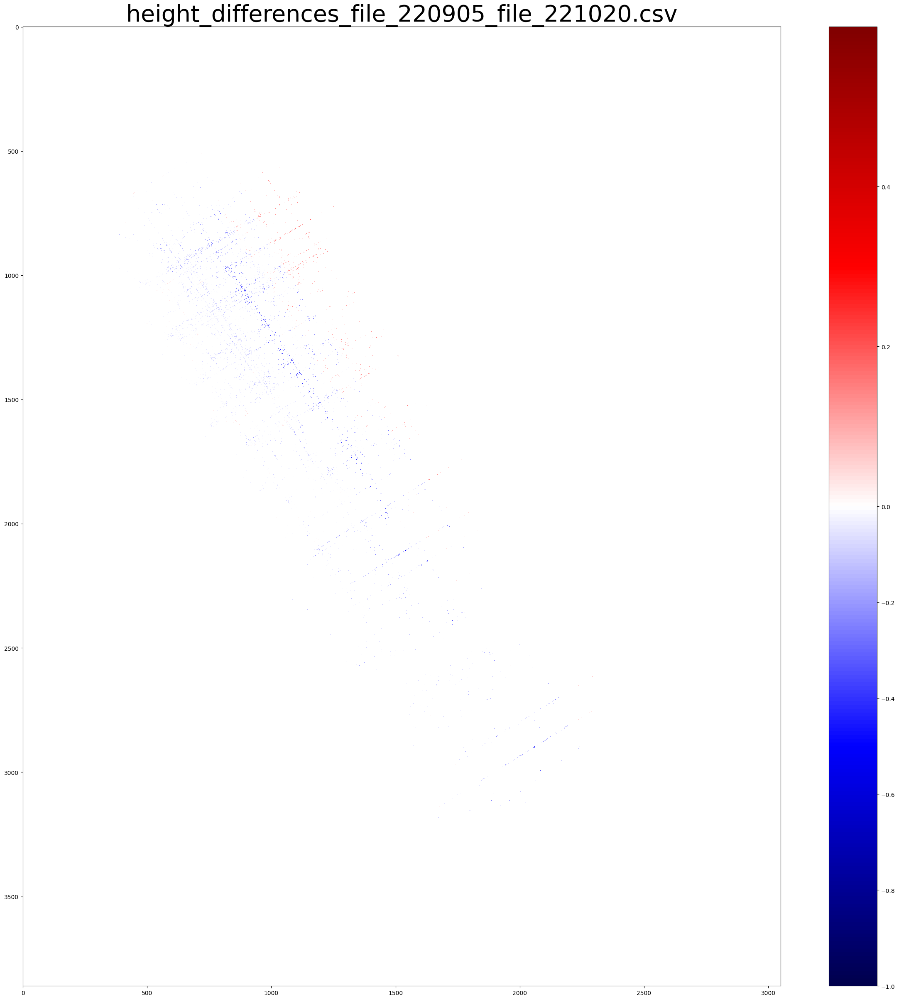

In [73]:
#z differences in 46 days between 220905 and 221020 (decimated to 5cm squares)
#very few datapoints because "file_221020" is a point cloud from 60m high instead of 15m.

file1 = "file_220905"
file2 = "file_221020"

zdiff = pd.read_csv(difference_file_name(file1, file2))

grid = zdiff.reset_index().pivot_table(columns='grid_x', index='grid_y', values='z')
plt.figure(figsize=(30, 30))
#grid.values[np.abs(grid.values) > 0.8] = np.nan
divnorm=colors.TwoSlopeNorm(vmin=-1, vcenter=0, vmax=0.6)
plt.title(difference_file_name(file1, file2), fontsize=40)
plt.imshow(grid.values, cmap = mpl.colormaps['seismic'], norm=divnorm)

plt.colorbar()

plt.savefig(difference_file_name(file1, file2).replace(".csv", ".png"))

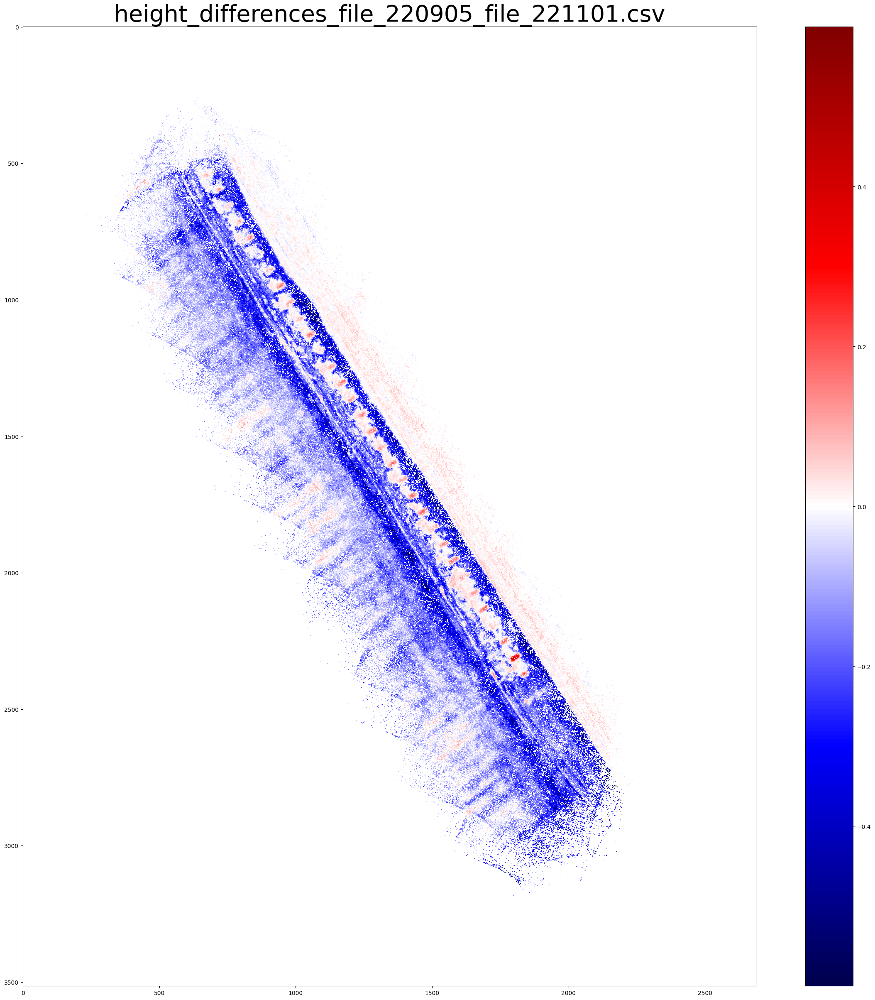

In [91]:
#z differences in 58 days between 220905 and 221101 (decimated to 5cm squares)

file1 = "file_220905"
file2 = "file_221101"

zdiff = pd.read_csv(difference_file_name(file1, file2))

grid = zdiff.reset_index().pivot_table(columns='grid_x', index='grid_y', values='z')
plt.figure(figsize=(30, 30))
#grid.values[np.abs(grid.values) > 0.8] = np.nan
divnorm=colors.TwoSlopeNorm(vmin=-0.6, vcenter=0, vmax=0.6)
plt.title(difference_file_name(file1, file2), fontsize=40)
plt.imshow(grid.values, cmap = mpl.colormaps['seismic'], norm=divnorm)

plt.colorbar()

plt.savefig(difference_file_name(file1, file2).replace(".csv", ".png"))

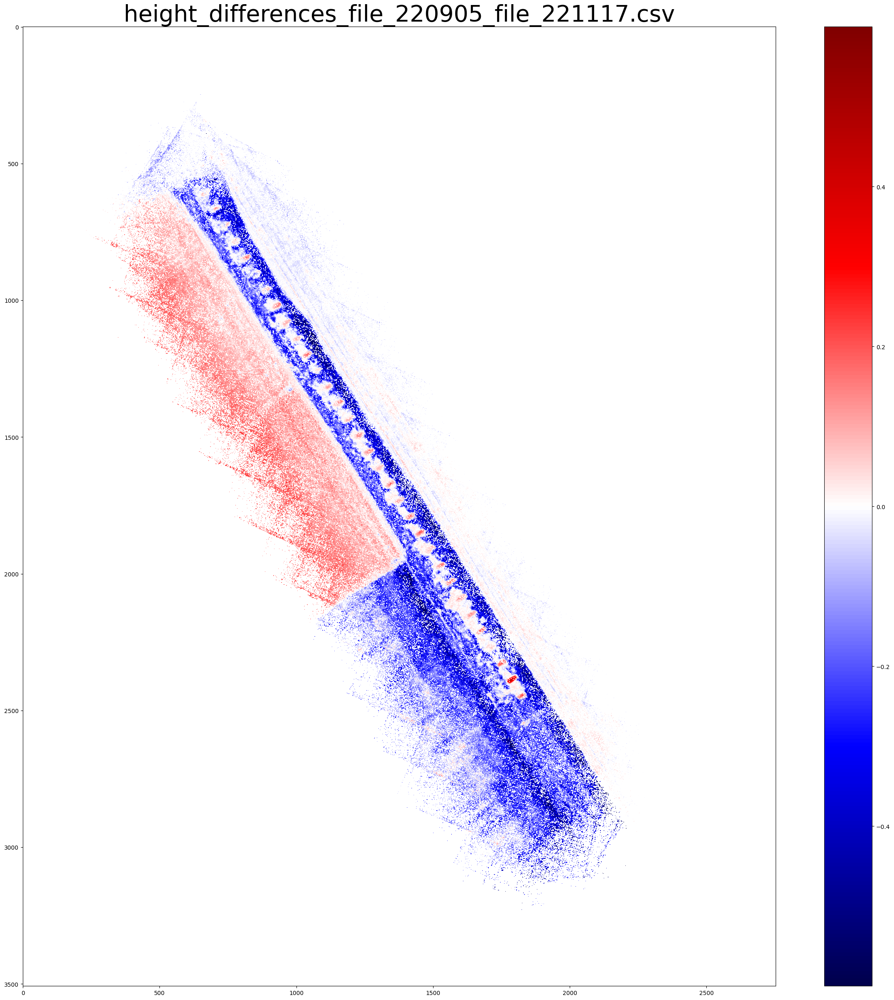

In [92]:
#z differences in 74 days between 220905 and 221117 (decimated to 5cm squares)

file1 = "file_220905"
file2 = "file_221117"

zdiff = pd.read_csv(difference_file_name(file1, file2))

grid = zdiff.reset_index().pivot_table(columns='grid_x', index='grid_y', values='z')
plt.figure(figsize=(30, 30))
#grid.values[np.abs(grid.values) > 0.8] = np.nan
divnorm=colors.TwoSlopeNorm(vmin=-0.6, vcenter=0, vmax=0.6)
plt.title(difference_file_name(file1, file2), fontsize=40)
plt.imshow(grid.values, cmap = mpl.colormaps['seismic'], norm=divnorm)

plt.colorbar()

plt.savefig(difference_file_name(file1, file2).replace(".csv", ".png"))

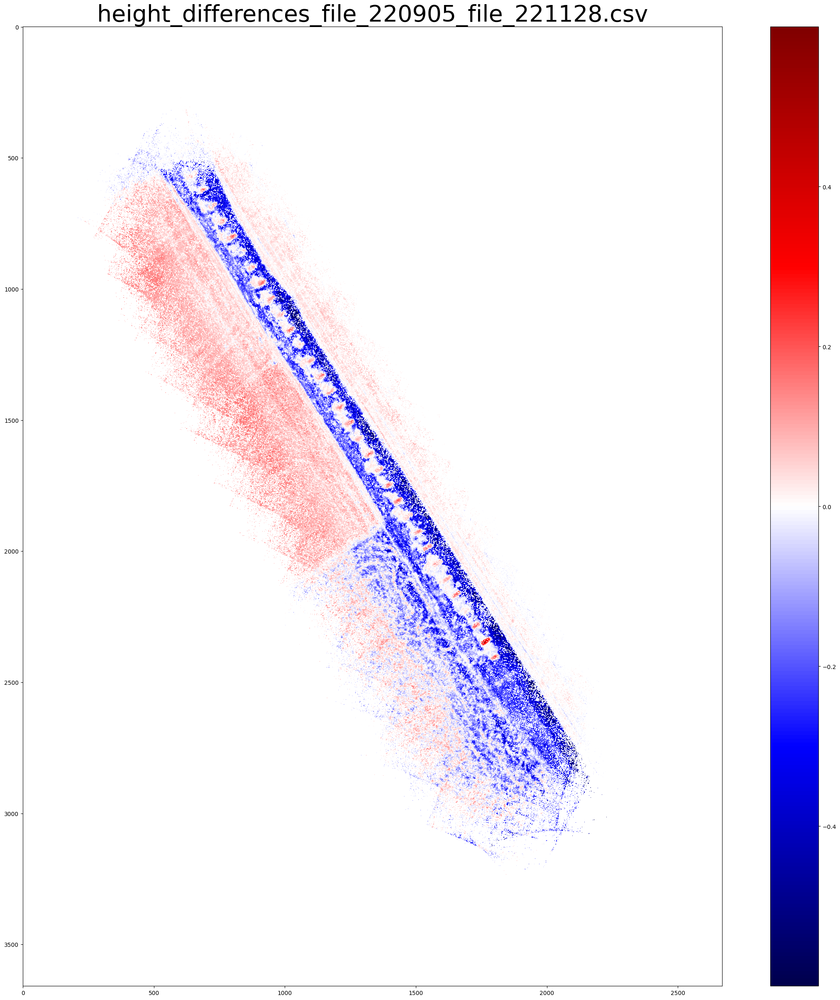

In [93]:
#z differences in 85 days between 220905 and 221128 (decimated to 5cm squares)


file1 = "file_220905"
file2 = "file_221128"

zdiff = pd.read_csv(difference_file_name(file1, file2))

grid = zdiff.reset_index().pivot_table(columns='grid_x', index='grid_y', values='z')
plt.figure(figsize=(30, 30))
#grid.values[np.abs(grid.values) > 0.8] = np.nan
divnorm=colors.TwoSlopeNorm(vmin=-0.6, vcenter=0, vmax=0.6)
plt.title(difference_file_name(file1, file2), fontsize=40)
plt.imshow(grid.values, cmap = mpl.colormaps['seismic'], norm=divnorm)

plt.colorbar()

plt.savefig(difference_file_name(file1, file2).replace(".csv", ".png"))

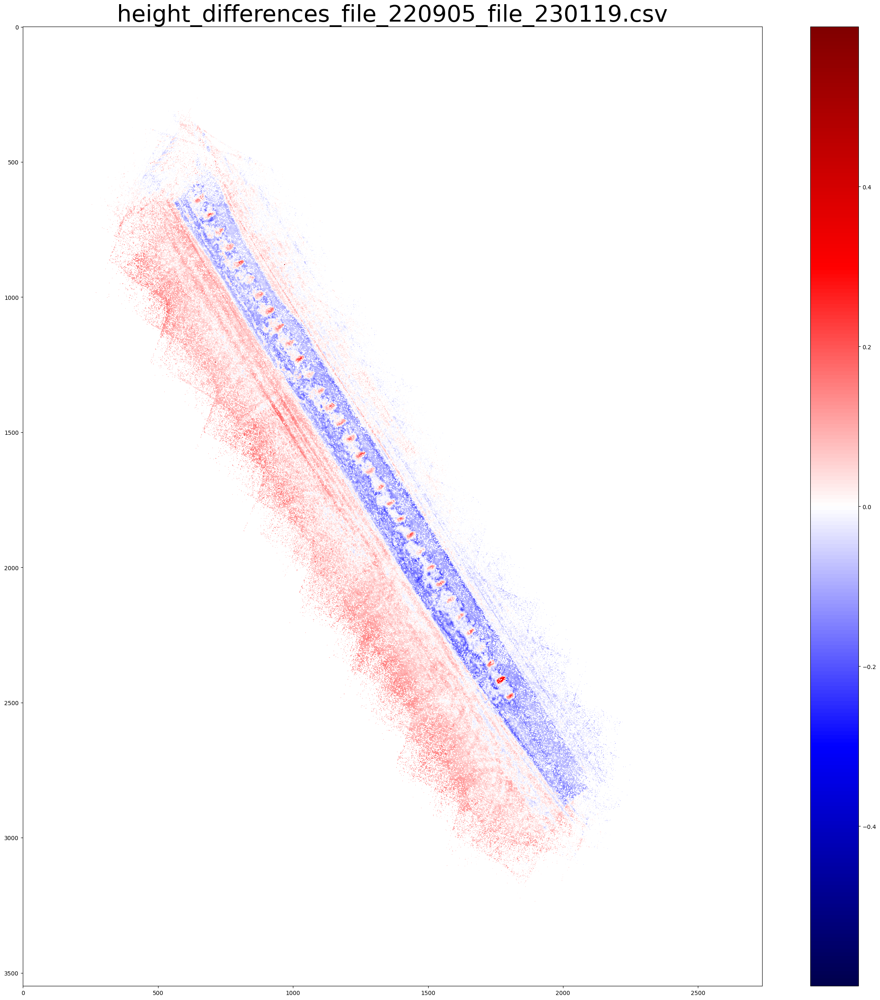

In [94]:
#z differences in 137 days between 220905 and 230119 (decimated to 5cm squares)

file1 = "file_220905"
file2 = "file_230119"

zdiff = pd.read_csv(difference_file_name(file1, file2))

grid = zdiff.reset_index().pivot_table(columns='grid_x', index='grid_y', values='z')
plt.figure(figsize=(30, 30))
#grid.values[np.abs(grid.values) > 0.8] = np.nan
divnorm=colors.TwoSlopeNorm(vmin=-0.6, vcenter=0, vmax=0.6)
plt.title(difference_file_name(file1, file2), fontsize=40)
plt.imshow(grid.values, cmap = mpl.colormaps['seismic'], norm=divnorm)

plt.colorbar()

plt.savefig(difference_file_name(file1, file2).replace(".csv", ".png"))

In [2]:
def heatmap(grid_table):
    grid = grid_table.reset_index().pivot_table(columns='grid_x', index='grid_y', values='z')
    plt.imshow(grid.values)

In [60]:
np.isnan(file_220829).any()

Unnamed: 0    False
grid_x        False
grid_y        False
z             False
x             False
y             False
dtype: bool

In [3]:
#histogram of z differences in about 1 week between 220905 and 220829 (open graves) (decimated to 5cm squares)

file1 = "file_220905"
file2 = "file_220829"

zdiff = pd.read_csv(difference_file_name(file1, file2))

grid = zdiff.reset_index().pivot_table(columns='grid_x', index='grid_y', values='z')


NameError: name 'difference_file_name' is not defined

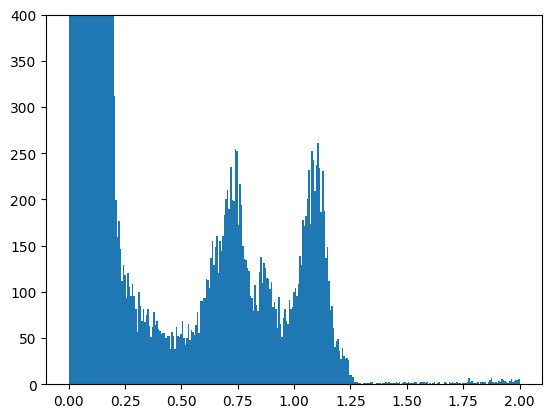

In [12]:
plt.hist(grid.values.flatten(), bins= np.linspace(0, 2, 300))
plt.ylim(0, 400)
plt.show()

In [13]:
grid.values[~np.isnan(grid.values)]

array([ 0.085,  0.06 ,  0.096, ..., -4.444, -1.524, -1.552])

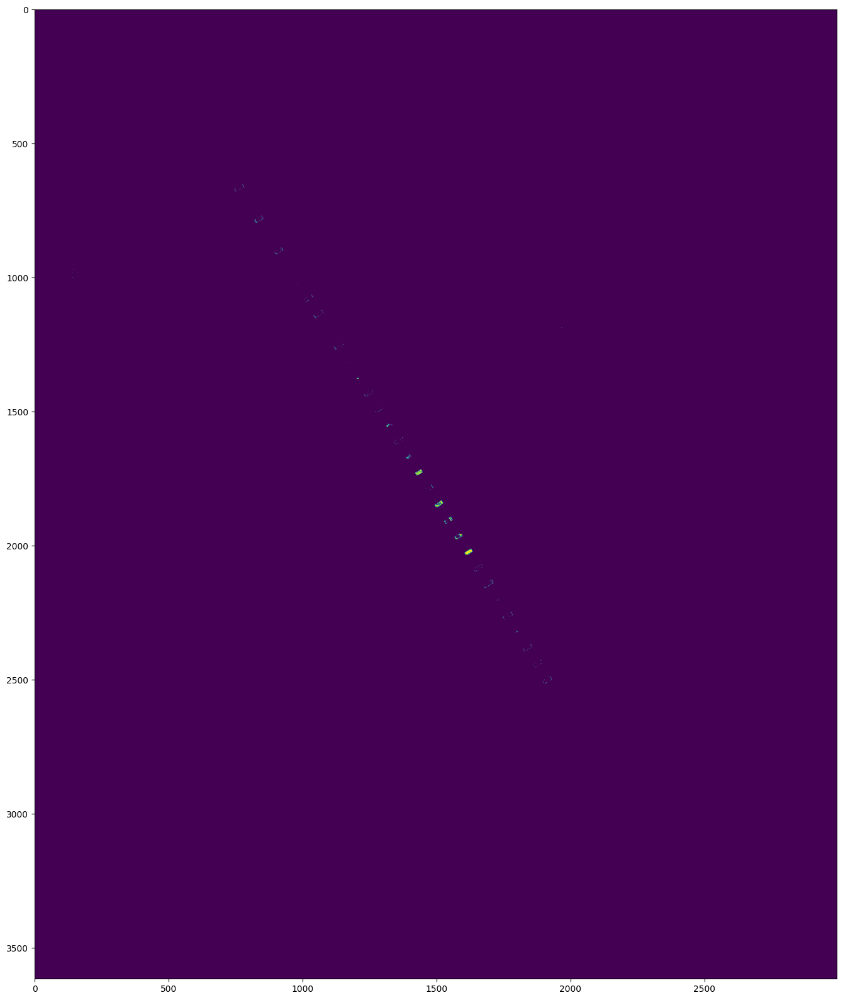

In [7]:
plt.figure(figsize = (20,20))
plt.imshow((grid.values > 0.8) & (grid.values < 0.9))


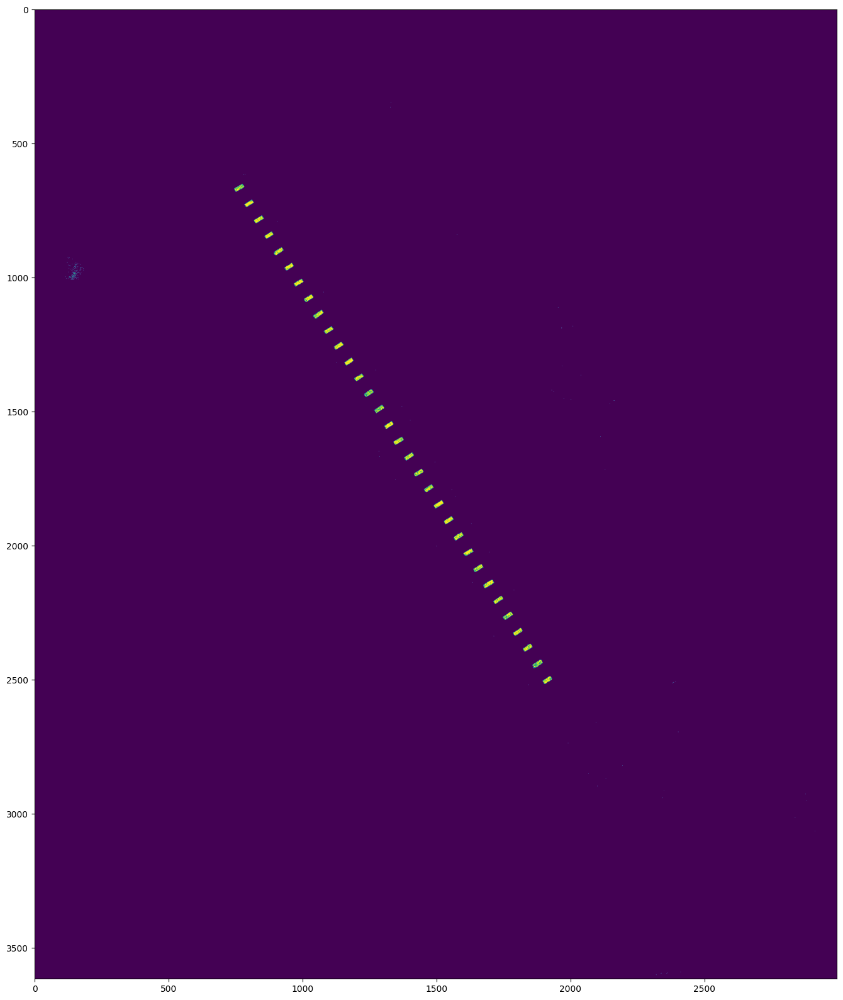

In [33]:
plt.figure(figsize = (20,20))
plt.imshow(grid.values > 0.45)

In [13]:
#extract the points that constitute graves based on height changes between empty graves on burial day and 2 weeks later.

grave_points = grid > 0.45

#grave_points.to_csv("grave_points_all.csv")

In [14]:
#separate the points into individual graves and save all these tables individually
grave_true = grave_points.melt(ignore_index = False).reset_index()
grave_true = grave_true[(grave_true['grid_x'] > (6.2010*1e6)) & (grave_true['grid_x'] < (6.2025*1e6))]
grave_true = grave_true[grave_true['value']]
print(grave_true)
#grave_trim = 


              grid_y     grid_x  value
2694588  103243445.0  6201116.0   True
2694589  103243446.0  6201116.0   True
2694590  103243447.0  6201116.0   True
2698204  103243445.0  6201117.0   True
2698205  103243446.0  6201117.0   True
...              ...        ...    ...
7473506  103245627.0  6202437.0   True
7574565  103245438.0  6202465.0   True
7592881  103245674.0  6202470.0   True
7634969  103244370.0  6202482.0   True
7696563  103244492.0  6202499.0   True

[14093 rows x 3 columns]


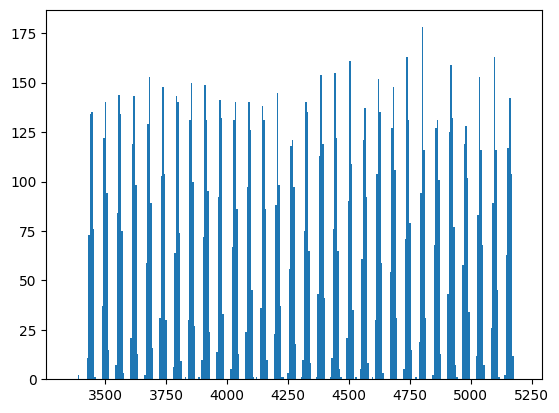

In [15]:
plt.hist(grave_true['grid_y']-1.0324e8, bins = np.linspace(3350, 5200, 300))
plt.show()

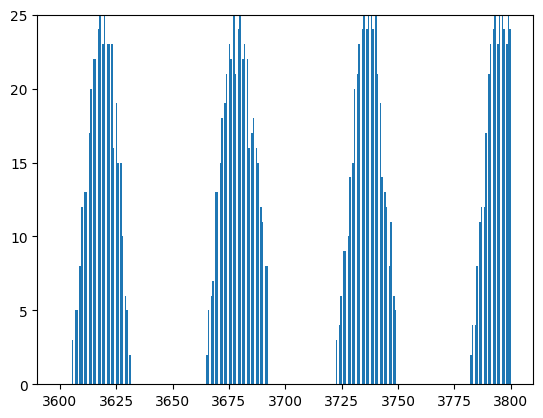

In [16]:
plt.hist(grave_true['grid_y']-1.0324e8, bins = np.linspace(3600, 3800, 300))
plt.ylim(0,25)
plt.show()

In [166]:

graves = {}

num_graves = 32

bottom = 3420+1.0324e8
top = 3460+1.0324e8

for i in range(1, num_graves+1):
    graves[f'T{i:02d}'] = grave_true[(grave_true['grid_y'] > bottom) & (grave_true['grid_y'] < top)]
    bottom = bottom + 60
    top = bottom + 40

print(graves['T03'])
    

              grid_y     grid_x  value
2962291  103243564.0  6201190.0   True
2962292  103243565.0  6201190.0   True
2965905  103243562.0  6201191.0   True
2965906  103243563.0  6201191.0   True
2965907  103243564.0  6201191.0   True
...              ...        ...    ...
3085228  103243557.0  6201224.0   True
3085229  103243558.0  6201224.0   True
3088843  103243556.0  6201225.0   True
3088844  103243557.0  6201225.0   True
3276888  103243569.0  6201277.0   True

[447 rows x 3 columns]


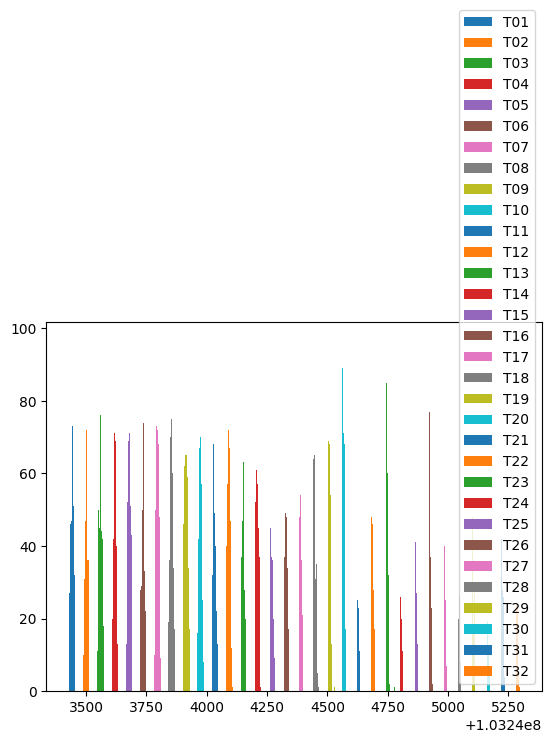

In [167]:
for name, value in graves.items():
    plt.hist(value['grid_y'], label = name)
    
plt.legend()

In [170]:
for name, value in graves.items():
    value = value.drop(columns = ['value'])
    value.to_csv(name +'/grave_points.csv', index = False)

In [1]:
#for every flight, compare their dataframes to that of each individial tomb's grave_points, 
#extract the grid_x and grid_y and their respective value that match, and save these matching points in
#the tomb's folder under the name of the flight.

In [5]:

from pathlib import Path

base_path = Path('.')
list(base_path.glob('T*'))

[WindowsPath('T01'),
 WindowsPath('T02'),
 WindowsPath('T03'),
 WindowsPath('T04'),
 WindowsPath('T05'),
 WindowsPath('T06'),
 WindowsPath('T07'),
 WindowsPath('T08'),
 WindowsPath('T09'),
 WindowsPath('T10'),
 WindowsPath('T11'),
 WindowsPath('T12'),
 WindowsPath('T13'),
 WindowsPath('T14'),
 WindowsPath('T15'),
 WindowsPath('T16'),
 WindowsPath('T17'),
 WindowsPath('T18'),
 WindowsPath('T19'),
 WindowsPath('T20'),
 WindowsPath('T21'),
 WindowsPath('T22'),
 WindowsPath('T23'),
 WindowsPath('T24'),
 WindowsPath('T25'),
 WindowsPath('T26'),
 WindowsPath('T27'),
 WindowsPath('T28'),
 WindowsPath('T29'),
 WindowsPath('T30'),
 WindowsPath('T31'),
 WindowsPath('T32')]

In [42]:
flight = 'file_230119'
flight_indexed_by_grid = datasets[flight].set_index(['grid_y', 'grid_x'], drop = True)

print(grave_true)

for name in base_path.glob('T*'):
    this_grave = pd.read_csv(name / "grave_points.csv")
    ids = this_grave.set_index(['grid_y', 'grid_x']).index.intersection(flight_indexed_by_grid.index)
    tomb_points = flight_indexed_by_grid.loc[ids]
    tomb_points.to_csv(str(name) + '/' + flight + '_' + name.name + '.csv')


              grid_y     grid_x  value
2694588  103243445.0  6201116.0   True
2694589  103243446.0  6201116.0   True
2694590  103243447.0  6201116.0   True
2698204  103243445.0  6201117.0   True
2698205  103243446.0  6201117.0   True
...              ...        ...    ...
7473506  103245627.0  6202437.0   True
7574565  103245438.0  6202465.0   True
7592881  103245674.0  6202470.0   True
7634969  103244370.0  6202482.0   True
7696563  103244492.0  6202499.0   True

[14093 rows x 3 columns]
